In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Prepare dataset

##Download from kaggle

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"vitaliyyeshor","key":"593935911a878a65cdacb8c277410d83"}'}

In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/

!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list

!kaggle competitions download -c airbus-ship-detection
!unzip /content/airbus-ship-detection.zip

Streaming output truncated to the last 5000 lines.
  inflating: train_v2/f977a470c.jpg  
  inflating: train_v2/f9780bfaf.jpg  
  inflating: train_v2/f9782bdfe.jpg  
  inflating: train_v2/f9785ca49.jpg  
  inflating: train_v2/f9785e462.jpg  
  inflating: train_v2/f97a719d5.jpg  
  inflating: train_v2/f97afa376.jpg  
  inflating: train_v2/f97b85e3e.jpg  
  inflating: train_v2/f97bd0b11.jpg  
  inflating: train_v2/f97bd6b80.jpg  
  inflating: train_v2/f97bfb1b2.jpg  
  inflating: train_v2/f97c8cbbe.jpg  
  inflating: train_v2/f97cdd397.jpg  
  inflating: train_v2/f97d92e1e.jpg  
  inflating: train_v2/f97da9e70.jpg  
  inflating: train_v2/f97e843d3.jpg  
  inflating: train_v2/f97e961f2.jpg  
  inflating: train_v2/f97e96c68.jpg  
  inflating: train_v2/f97f63ae1.jpg  
  inflating: train_v2/f97f80839.jpg  
  inflating: train_v2/f97f83438.jpg  
  inflating: train_v2/f97fab9ad.jpg  
  inflating: train_v2/f97fd4915.jpg  
  inflating: train_v2/f9801bc03.jpg  
  inflating: train_v2/f98022dd0.jpg  

##Mask Generation

In [ ]:
import os

import pandas as pd
import numpy as np
import cv2

TRAIN_FOLDER = '/content/train_v2'
TEST_FOLDER = '/content/test_v2'

train_v2_masks = 'train_v2_masks'
!rm -rf {train_v2_masks}
!mkdir -p {train_v2_masks}/images/
!mkdir -p {train_v2_masks}/masks/

def rle_to_binary_image(rle_string, height, width):
    # Split the RLE string
    rle_values = rle_string.split()
    # Extract the pixel positions and counts
    positions = np.array(rle_values[0::2], dtype=int) - 1
    counts = np.array(rle_values[1::2], dtype=int)
    # Calculate the total number of pixels
    total_pixels = height * width
    # Create an array of zeros for the binary image
    binary_image = np.zeros(total_pixels, dtype=np.uint8)
    # Fill the binary image with ones based on positions and counts
    for pos, count in zip(positions, counts):
        binary_image[pos:pos+count] = 255
    # Reshape the binary image array to the specified height and width
    return binary_image.reshape(height, width).T


def create_dataset(data):
  for index, row in data.iterrows():
      image_name = row['ImageId']
      encoded_pixels = row['EncodedPixels']
      image = cv2.imread(os.path.join(TRAIN_FOLDER, image_name))
      height, width = image.shape[:2]
      binary_image = rle_to_binary_image(encoded_pixels, height, width)
      # Save the binary image
      mask_path = f"{train_v2_masks}/masks/{image_name}"
      if os.path.exists(mask_path):
        mask = cv2.imread(mask_path, 0)
        binary_image = cv2.bitwise_or(binary_image, mask)
      else:
        cv2.imwrite(f"{train_v2_masks}/images/{image_name}", image)
      cv2.imwrite(mask_path, binary_image)


data = pd.read_csv('/content/train_ship_segmentations_v2.csv')
data = data.dropna(subset=['EncodedPixels'])
create_dataset(data)

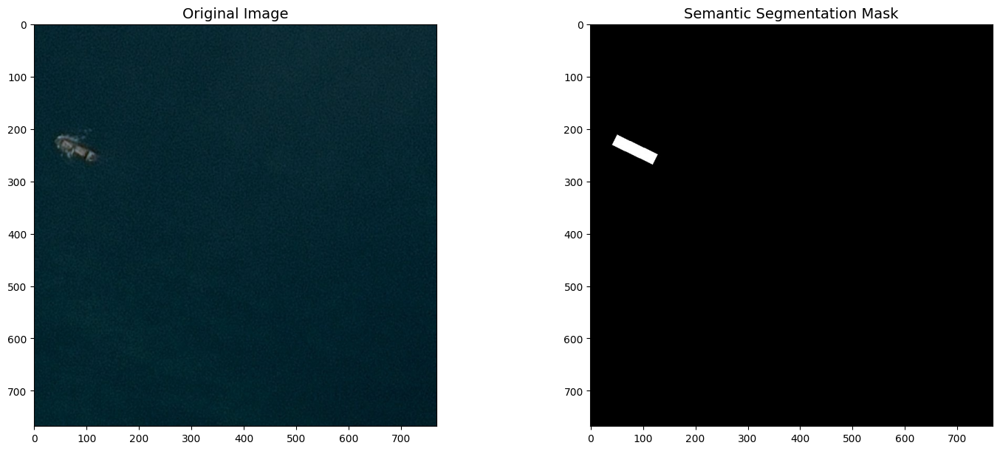

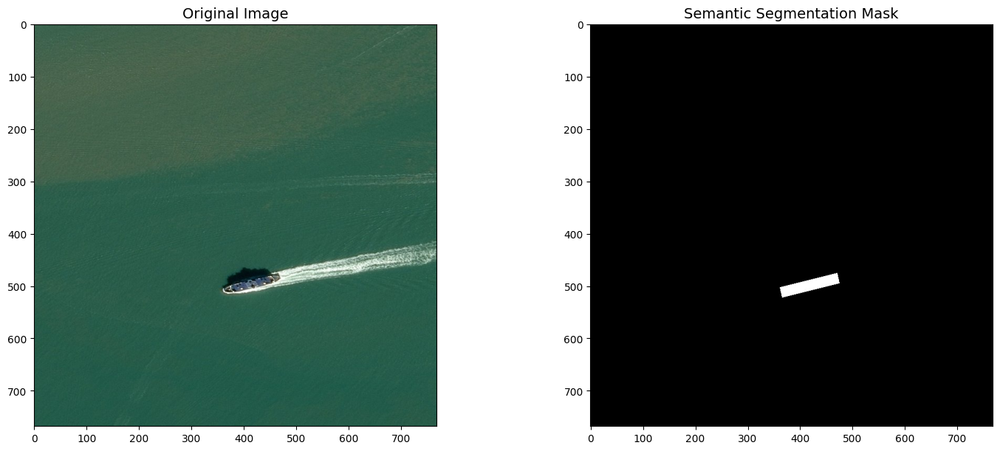

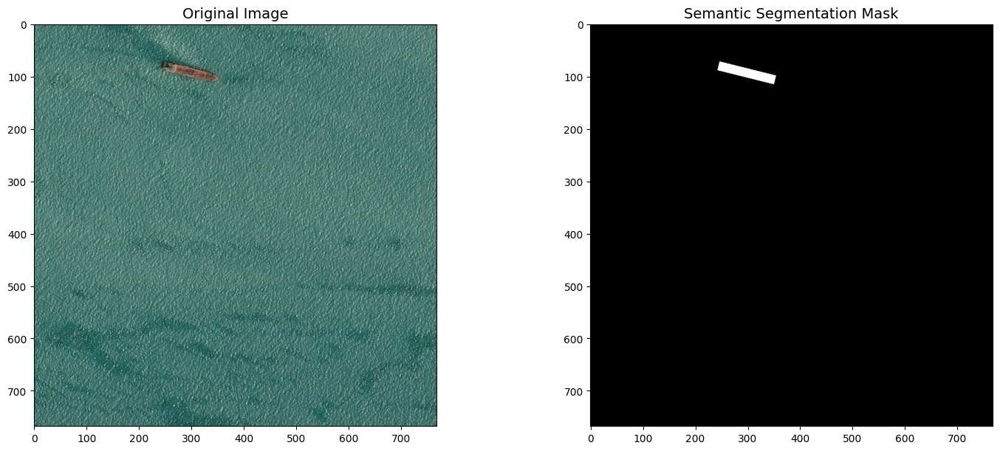

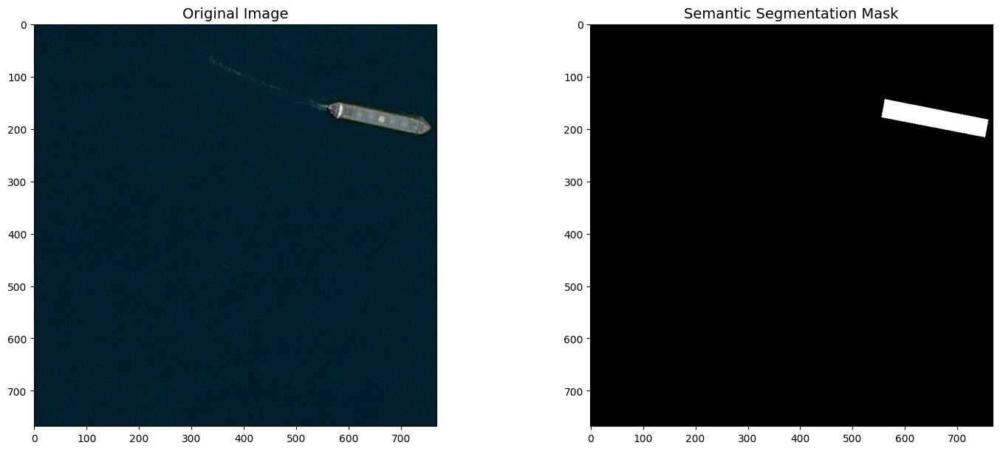

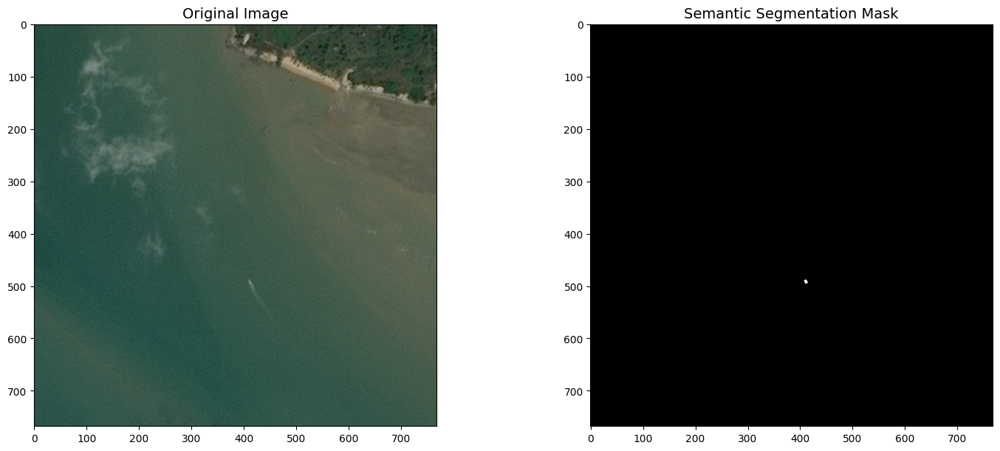

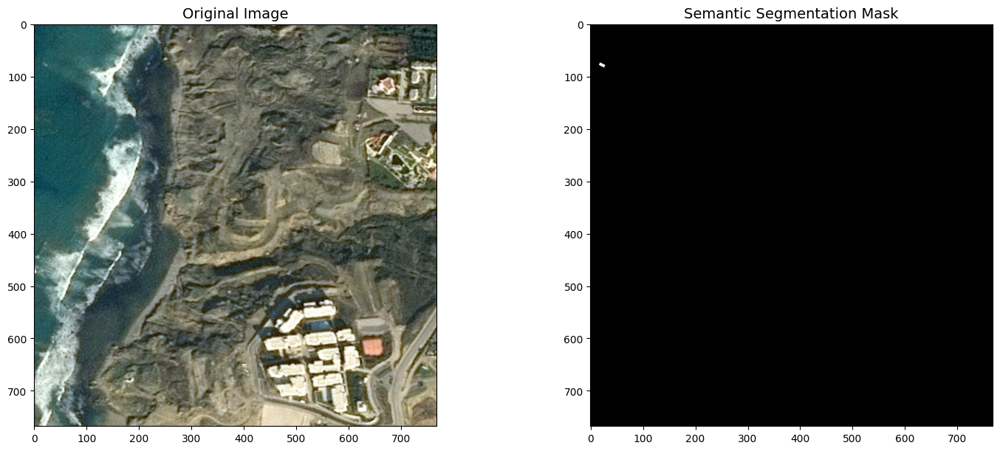

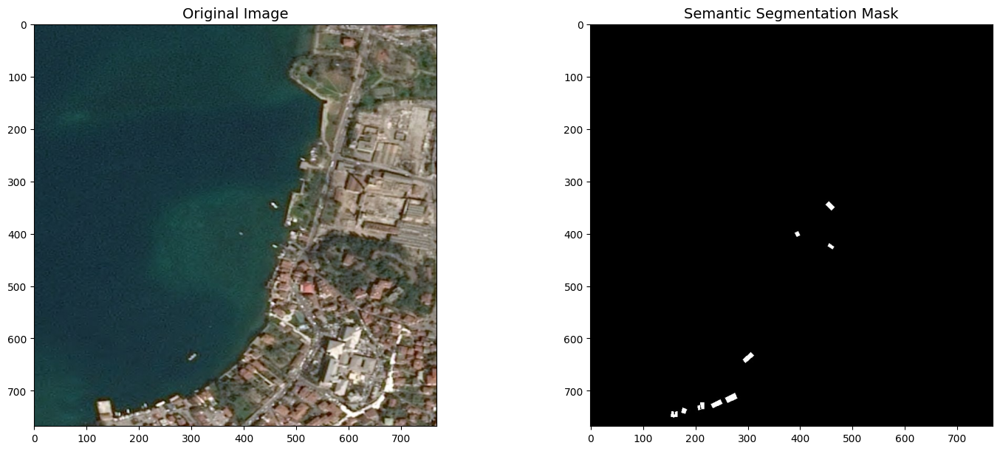

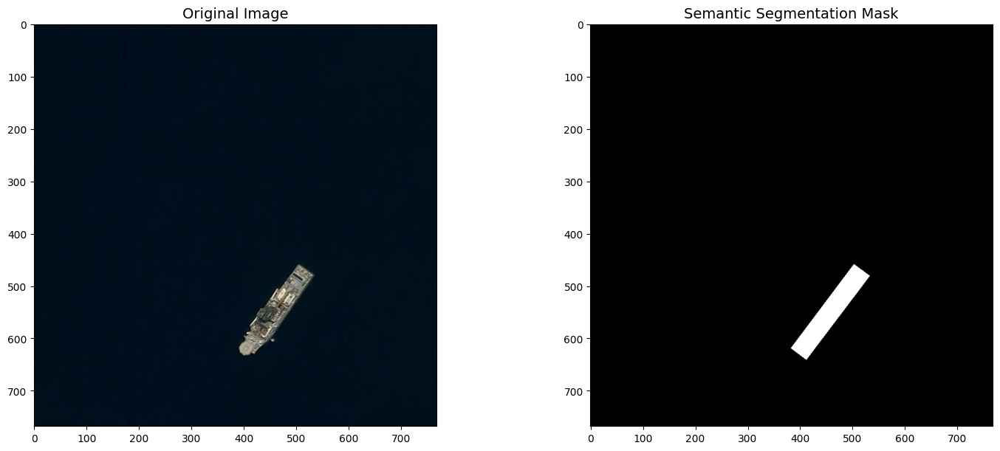

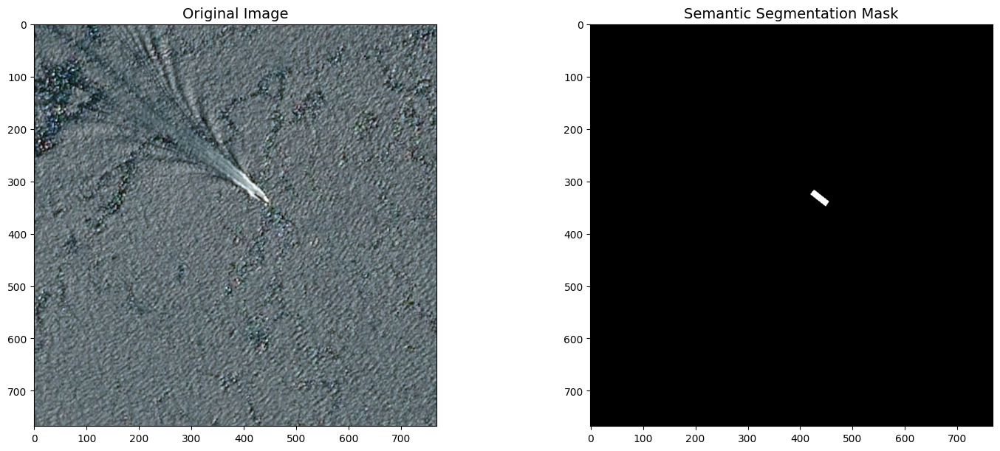

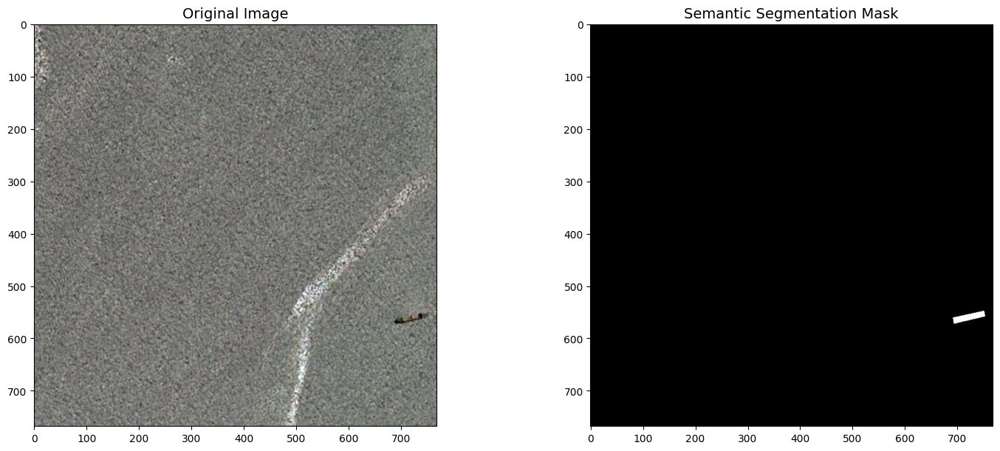

In [ ]:
import glob
import matplotlib.pyplot as plt

def show_data(images):
    for image in images:
        fig, axs = plt.subplots(1, 2, figsize=(15, 6), constrained_layout=True)
        original_image = cv2.imread(image)
        original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
        axs[0].imshow(original_image)
        axs[0].set_title('Original Image', fontdict = {'fontsize':14, 'fontweight': 'medium'})
        mask_path = image.replace('images', 'masks')
        mask = cv2.imread(mask_path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        axs[1].imshow(mask)
        axs[1].set_title('Semantic Segmentation Mask', fontdict = {'fontsize':14, 'fontweight': 'medium'})
        plt.show()

        
images = glob.glob('/content/train_v2_masks/images/*')[:10]
show_data(images)    

In [ ]:
!ls /content/train_v2_masks/images | wc -l
!ls /content/train_v2_masks/masks | wc -l

42556
42556


In [ ]:
!rm -rf /content/airbus-ship-detection.zip

In [ ]:
import glob
import random
import shutil

split_train_dataset = 'split_train_dataset'
!rm -rf {split_train_dataset}
!mkdir -p {split_train_dataset}/train/images/ship
!mkdir -p {split_train_dataset}/train/masks/ship
!mkdir -p {split_train_dataset}/valid/images/ship
!mkdir -p {split_train_dataset}/valid/masks/ship

def split_dataset(images):
  random.shuffle(images)
  split = int(0.8 * len(images))
  train_images = images[:split]
  valid_images = images[split:]
  print('train', len(train_images))
  for img in train_images:
    shutil.copy(img, f"{split_train_dataset}/train/images/ship")
    mask = img.replace('images', 'masks')
    shutil.copy(mask, f"{split_train_dataset}/train/masks/ship")
  print('valid', len(valid_images))
  for img in valid_images:
    shutil.copy(img, f"{split_train_dataset}/valid/images/ship")
    mask = img.replace('images', 'masks')
    shutil.copy(mask, f"{split_train_dataset}/valid/masks/ship")

split_dataset(glob.glob('/content/train_v2_masks/images/*'))

train 34044
valid 8512


In [ ]:
!ls /content/split_train_dataset/train/images/ship | wc -l
!ls /content/split_train_dataset/train/masks/ship | wc -l

!ls /content/split_train_dataset/valid/images/ship | wc -l
!ls /content/split_train_dataset/valid/masks/ship | wc -l

In [ ]:
!zip -r split_train_dataset.zip ./split_train_dataset

In [ ]:
!cp /content/split_train_dataset.zip '/content/drive/MyDrive/Airbus_Ship_Detection_Challenge'

In [ ]:
!cp /content/drive/MyDrive/Airbus_Ship_Detection_Challenge/split_train_dataset.zip .

In [ ]:
!unzip /content/split_train_dataset.zip

# tf.Keras InceptionResNetV2 UNet

In [ ]:
import pickle
import numpy as np
import pandas as pd
from PIL import Image
import albumentations as A
from IPython.display import SVG
import matplotlib.pyplot as plt
%matplotlib inline
import os, re, sys, random, shutil, cv2

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam, Nadam
from tensorflow.keras import applications, optimizers
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.resnet50 import preprocess_input

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.utils import model_to_dot, plot_model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger, LearningRateScheduler
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, ZeroPadding2D, Dropout

# Create Useful Label & Code Conversion Dictionaries

These will be used for:

* One hot encoding the mask labels for model training
* Decoding the predicted labels for interpretation and visualization

In [ ]:
label_names = ['background', 'ship']
label_codes = [(0, 0, 0), (255, 255, 255)]

code2id = {v:k for k,v in enumerate(label_codes)}
id2code = {k:v for k,v in enumerate(label_codes)}

name2id = {v:k for k,v in enumerate(label_names)}
id2name = {k:v for k,v in enumerate(label_names)}

# Define Functions for One Hot Encoding RGB Labels & Decoding Encoded Predictions

In [ ]:
def rgb_to_onehot(rgb_image, colormap = id2code):
    '''Function to one hot encode RGB mask labels
        Inputs: 
            rgb_image - image matrix (eg. 256 x 256 x 3 dimension numpy ndarray)
            colormap - dictionary of color to label id
        Output: One hot encoded image of dimensions (height x width x num_classes) where num_classes = len(colormap)
    '''
    num_classes = len(colormap)
    shape = rgb_image.shape[:2]+(num_classes,)
    encoded_image = np.zeros( shape, dtype=np.int8 )
    for i, cls in enumerate(colormap):
        encoded_image[:,:,i] = np.all(rgb_image.reshape( (-1,3) ) == colormap[i], axis=1).reshape(shape[:2])
    return encoded_image


def onehot_to_rgb(onehot, colormap = id2code):
    '''Function to decode encoded mask labels
        Inputs: 
            onehot - one hot encoded image matrix (height x width x num_classes)
            colormap - dictionary of color to label id
        Output: Decoded RGB image (height x width x 3) 
    '''
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros( onehot.shape[:2]+(3,) )
    for k in colormap.keys():
        output[single_layer==k] = colormap[k]
    return np.uint8(output)

# Creating Custom Image Data Generators
## Defining Data Generators

In [ ]:
# Normalizing only frame images, since masks contain label info
data_gen_args = dict(rescale=1./255)
mask_gen_args = dict()

train_frames_datagen = ImageDataGenerator(**data_gen_args)
train_masks_datagen = ImageDataGenerator(**mask_gen_args)
val_frames_datagen = ImageDataGenerator(**data_gen_args)
val_masks_datagen = ImageDataGenerator(**mask_gen_args)

# Seed defined for aligning images and their masks
seed = 1

# Custom Image Data Generators for Creating Batches of Frames and Masks

In [ ]:
def TrainAugmentGenerator(train_images_dir, train_masks_dir, seed = 1, batch_size = 8, target_size = (512, 512)):
    '''Train Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            train_images_dir - train images directory
            train_masks_dir - train masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    train_image_generator = train_frames_datagen.flow_from_directory(train_images_dir,
                                                                     batch_size = batch_size, 
                                                                     seed = seed, 
                                                                     target_size = target_size)
    
    train_mask_generator = train_masks_datagen.flow_from_directory(train_masks_dir,
                                                                   batch_size = batch_size, 
                                                                   seed = seed, 
                                                                   target_size = target_size)

    while True:
        X1i = train_image_generator.next()
        X2i = train_mask_generator.next()
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id2code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

def ValAugmentGenerator(val_images_dir, val_masks_dir, seed = 1, batch_size = 8, target_size = (512, 512)):
    '''Validation Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            val_images_dir - validation images directory
            val_masks_dir - validation masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    val_image_generator = val_frames_datagen.flow_from_directory(
    val_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    val_mask_generator = val_masks_datagen.flow_from_directory(
    val_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    while True:
        X1i = val_image_generator.next()
        X2i = val_mask_generator.next()
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id2code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

# Model

In [ ]:
train_images = "/content/split_train_dataset/train/images"
train_masks = "/content/split_train_dataset/train/masks"
val_images = "/content/split_train_dataset/valid/images"
val_masks = "/content/split_train_dataset/valid/masks"

batch_size = 4
num_train_samples = len(np.sort(os.listdir(os.path.join(train_images, 'ship'))))
num_val_samples = len(np.sort(os.listdir(os.path.join(val_images, 'ship'))))
steps_per_epoch = np.ceil(float(num_train_samples) / float(batch_size))
print('steps_per_epoch: ', steps_per_epoch)
validation_steps = np.ceil(float(4 * num_val_samples) / float(batch_size))
print('validation_steps: ', validation_steps)

steps_per_epoch:  8511.0
validation_steps:  8512.0


## InceptionResNetV2 UNet

In [ ]:
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_inception_resnetv2_unet(input_shape):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained InceptionResNetV2 Model """
    encoder = InceptionResNetV2(include_top=False, weights="imagenet", input_tensor=inputs)

    """ Encoder """
    s1 = encoder.get_layer("input_1").output           ## (512 x 512)

    s2 = encoder.get_layer("activation").output        ## (255 x 255)
    s2 = ZeroPadding2D(( (1, 0), (1, 0) ))(s2)         ## (256 x 256)

    s3 = encoder.get_layer("activation_3").output      ## (126 x 126)
    s3 = ZeroPadding2D((1, 1))(s3)                     ## (128 x 128)

    s4 = encoder.get_layer("activation_74").output      ## (61 x 61)
    s4 = ZeroPadding2D(( (2, 1),(2, 1) ))(s4)           ## (64 x 64)

    """ Bridge """
    b1 = encoder.get_layer("activation_161").output     ## (30 x 30)
    b1 = ZeroPadding2D((1, 1))(b1)                      ## (32 x 32)

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                     ## (64 x 64)
    d2 = decoder_block(d1, s3, 256)                     ## (128 x 128)
    d3 = decoder_block(d2, s2, 128)                     ## (256 x 256)
    d4 = decoder_block(d3, s1, 64)                      ## (512 x 512)
    
    """ Output """
    dropout = Dropout(0.3)(d4)
    outputs = Conv2D(2, 1, padding="same", activation="softmax")(dropout)

    model = Model(inputs, outputs, name="InceptionResNetV2-UNet")
    return model

In [ ]:
K.clear_session()

def dice_coef(y_true, y_pred):
    return (2. * K.sum(y_true * y_pred) + 1.) / (K.sum(y_true) + K.sum(y_pred) + 1.)

model = build_inception_resnetv2_unet(input_shape = (768, 768, 3))
model.compile(optimizer=Adam(lr = 0.001), loss='categorical_crossentropy', metrics=[dice_coef, "accuracy"])
model.summary()

Model: "InceptionResNetV2-UNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 768, 768, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 383, 383, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 383, 383, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                            

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.631775 to fit



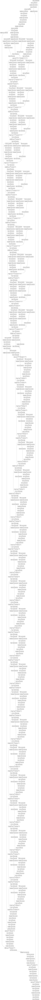

In [ ]:
SVG(model_to_dot(model).create(prog='dot', format='svg'))
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

In [ ]:
def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 **(epoch / s)
    return exponential_decay_fn

exponential_decay_fn = exponential_decay(0.001, 60)

lr_scheduler = LearningRateScheduler(
    exponential_decay_fn,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath = 'InceptionResNetV2-UNet.h5',
    save_best_only = True, 
#     save_weights_only = False,
    monitor = 'val_loss', 
    mode = 'auto', 
    verbose = 1
)

earlystop = EarlyStopping(
    monitor = 'val_loss', 
    min_delta = 0.001, 
    patience = 12, 
    mode = 'auto', 
    verbose = 1,
    restore_best_weights = True
)

csvlogger = CSVLogger(
    filename= "model_training.csv",
    separator = ",",
    append = False
)

callbacks = [checkpoint, earlystop, csvlogger, lr_scheduler]

In [ ]:
history = model.fit(
    TrainAugmentGenerator(train_images_dir = train_images, train_masks_dir = train_masks, batch_size=batch_size, target_size = (768, 768)), 
    steps_per_epoch = steps_per_epoch,
    validation_data = ValAugmentGenerator(val_images_dir = val_images, val_masks_dir = val_masks, batch_size=batch_size, target_size = (768, 768)), 
    validation_steps = validation_steps, 
    epochs = 50,
    callbacks=callbacks,
    use_multiprocessing=False,
    verbose=1,
)

In [ ]:
df_result = pd.DataFrame(history.history)
df_result

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(40, 5))
ax = ax.ravel()
metrics = ['Dice Coefficient', 'Accuracy', 'Loss', 'Learning Rate']

for i, met in enumerate(['dice_coef', 'accuracy', 'loss', 'lr']): 
    if met != 'lr':
        ax[i].plot(history.history[met])
        ax[i].plot(history.history['val_' + met])
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs')
        ax[i].set_ylabel(metrics[i])
        ax[i].set_xticks(np.arange(0,45,4))
        ax[i].legend(['Train', 'Validation'])
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
    else:
        ax[i].plot(history.history[met])
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs')
        ax[i].set_ylabel(metrics[i])
        ax[i].set_xticks(np.arange(0,45,4))
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        
plt.savefig('model_metrics_plot.png', facecolor= 'w',transparent= False, bbox_inches= 'tight', dpi= 150)

In [ ]:
model.load_weights("./InceptionResNetV2-UNet.h5")

In [ ]:
testing_gen = ValAugmentGenerator(val_images_dir = val_images, val_masks_dir = val_masks, target_size = (512, 512))

In [ ]:
!mkdir predictions

In [ ]:
count = 0
for i in range(2):
    batch_img,batch_mask = next(testing_gen)
    pred_all= model.predict(batch_img)
    np.shape(pred_all)
    
    for j in range(0,np.shape(pred_all)[0]):
        count += 1
        fig = plt.figure(figsize=(20,8))

        ax1 = fig.add_subplot(1,3,1)
        ax1.imshow(batch_img[j])
        ax1.set_title('Input Image', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax1.grid(False)

        ax2 = fig.add_subplot(1,3,2)
        ax2.set_title('Ground Truth Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax2.imshow(onehot_to_rgb(batch_mask[j],id2code))
        ax2.grid(False)

        ax3 = fig.add_subplot(1,3,3)
        ax3.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax3.imshow(onehot_to_rgb(pred_all[j],id2code))
        ax3.grid(False)

        plt.savefig('./predictions/prediction_{}.png'.format(count), facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 200)
        plt.show()

# Swin-Transformer-Semantic-Segmentation

In [ ]:
!cp /content/drive/MyDrive/Airbus_Ship_Detection_Challenge/split_train_dataset.zip .

In [ ]:
!unzip /content/split_train_dataset.zip

In [ ]:
!git clone https://github.com/SwinTransformer/Swin-Transformer-Semantic-Segmentation.git

In [ ]:
!wget https://github.com/SwinTransformer/storage/releases/download/v1.0.1/upernet_swin_tiny_patch4_window7_512x512.pth

In [ ]:
!pip install -r /content/Swin-Transformer-Semantic-Segmentation/requirements.txt

In [ ]:
!pip install mmcv==1.3.0

In [ ]:
!python /content/Swin-Transformer-Semantic-Segmentation/tools/train.py /content/Swin-Transformer-Semantic-Segmentation/configs/swin/upernet_swin_tiny_patch4_window7_512x512_160k_ade20k.py  --options model.pretrained=/content/upernet_swin_tiny_patch4_window7_512x512.pth [model.backbone.use_checkpoint=True] [other optional arguments]

# PyTorch Unet

In [1]:
!git clone https://github.com/vitalik-ez/Airbus-Ship-Detection-Challenge.git

Cloning into 'Airbus-Ship-Detection-Challenge'...
remote: Enumerating objects: 24, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 24 (delta 5), reused 20 (delta 4), pack-reused 0
Unpacking objects: 100% (24/24), 11.35 KiB | 1.89 MiB/s, done.


In [2]:
%cd /content/Airbus-Ship-Detection-Challenge

/content/Airbus-Ship-Detection-Challenge


In [3]:
!pwd

/content/Airbus-Ship-Detection-Challenge


In [4]:
%cd input/
!gdown 1hB6OGyWpk9RORirtw-KCkcL1Cwn6UPBk

/content/Airbus-Ship-Detection-Challenge/input
Downloading...
From: https://drive.google.com/uc?id=1hB6OGyWpk9RORirtw-KCkcL1Cwn6UPBk
To: /content/Airbus-Ship-Detection-Challenge/input/split_train_dataset.zip
100% 6.41G/6.41G [01:10<00:00, 91.1MB/s]


In [5]:
!unzip split_train_dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: split_train_dataset/valid/images/ship/d5d649b75.jpg  
  inflating: split_train_dataset/valid/images/ship/9c3e750e1.jpg  
  inflating: split_train_dataset/valid/images/ship/05eeb2407.jpg  
  inflating: split_train_dataset/valid/images/ship/8b2ab9c9b.jpg  
  inflating: split_train_dataset/valid/images/ship/1d8bc2454.jpg  
  inflating: split_train_dataset/valid/images/ship/716f90af1.jpg  
  inflating: split_train_dataset/valid/images/ship/4a4a6ccd2.jpg  
  inflating: split_train_dataset/valid/images/ship/96d63a492.jpg  
  inflating: split_train_dataset/valid/images/ship/fcb77eaee.jpg  
  inflating: split_train_dataset/valid/images/ship/aaf30b028.jpg  
  inflating: split_train_dataset/valid/images/ship/cc7877483.jpg  
  inflating: split_train_dataset/valid/images/ship/a67c05467.jpg  
  inflating: split_train_dataset/valid/images/ship/5b6db1839.jpg  
  inflating: split_train_dataset/valid/images/ship/7e2742873.jpg  
  inflating

In [9]:
%cd /content/Airbus-Ship-Detection-Challenge/src
!python train.py --epochs 5 --batch 4 --lr 0.005 --imgs 768

/content/Airbus-Ship-Detection-Challenge/src
Namespace(epochs=5, lr=0.005, batch=4, imgsz=768, scheduler=False)
UNet(
  (max_pool2d): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (down_convolution_1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (down_convolution_2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=Tru